In [1]:
import numpy as np
import pandas
import random
import matplotlib.pyplot as plt
from matplotlib import animation, rc
from IPython.display import HTML
import matplotlib
import copy

### Визуализация траекторий

In [2]:
def get_colors(distances, alpha=True):
    normed = np.array(distances) - np.min(distances)
    normed = normed / np.max(normed)
    alpha = 1/np.mean([len(row) for row in normed])**0.5 if alpha else 1.
    return [[((1. if n > 0.5 else 2 * n), (1. if n < 0.5 else 2 - 2*n), 0., alpha) 
             for n in row] for row in normed]

def get_coords(points):
    results = []
    for pts in points:
        x_prev, _ = pts[0]
        result = [pts[0]]
        for x, y in list(pts[1:]) + [pts[0]]:
            result.append((x_prev, y))
            result.append((x, y))
            x_prev = x
        results.append(list(zip(*result)))
    return results

def init_figure(X):
    upper_bound, lower_bound = X.max(axis=0) + 1, X.min(axis=0) - 1
    fig, ax = plt.subplots(figsize=(10, 10), nrows=1, ncols=1)
    #ax.set_facecolor((0.1, 0.1, 0.1))
    ax.grid(True)
    #ax.grid(True, color=(0.9, 0.9, 0.9))
    ax.set_xticks(range(lower_bound[0], upper_bound[0]))
    ax.set_yticks(range(lower_bound[1], upper_bound[1]))
    ax.set_xlim(lower_bound[0], upper_bound[0])
    ax.set_ylim(lower_bound[1], upper_bound[1])
    ax.set_xticklabels([])
    ax.set_yticklabels([])
    ax.scatter(X[:, 0], X[:, 1], color=(0, 0, 1))
    plt.tight_layout()
    return fig, ax    

def visualize_genetic(X, genetic):
    fig, ax = init_figure(X)
    populations = genetic.optimize_explain(X)
    distances = [[cyclic_distance(X[p], genetic.dist) for p in populations[i]] for i in range(len(populations))]
    colors = get_colors(distances)
    coords = get_coords([X[p] for p in populations[0]])
    plots = [ax.plot(x, y, color=c)[0] for (x, y), c in zip(coords, colors[0])]
    best_id = np.argmin(distances[0])
    best_plot = ax.plot(*coords[best_id], color=(0.3, 0.3, 1, 0.9), linestyle="-.")[0]
    
    def animate(i):
        coords = get_coords([X[p] for p in populations[i]])
        for p, (x, y), c in zip(plots, coords, colors[i]):
            p.set_color(c)
            p.set_data(x, y)
        best_id = np.argmin(distances[i])
        best_plot.set_data(*coords[best_id])
        return plots + [best_plot]
    
    return animation.FuncAnimation(fig, animate, frames=len(populations), interval=100, blit=True)

### Метрики

In [3]:
def cyclic_distance(points, dist):
    distance = 0
    points_2 = np.concatenate((points[-1].reshape(1, -1), points[:-1]), axis=0)    
    for i in range(len(points)):
        distance += dist(points[i], points_2[i])
    return distance
    
    
def l2_distance(p1, p2):
    return np.sqrt(np.sum(np.square(p1 - p2)))
#     return np.linalg.norm((p1 - p2), ord=2)


def l1_distance(p1, p2):
    return np.sum(np.abs(p1 - p2))
#     return np.linalg.norm((p1 - p2), ord=1)

### Genetic Algorith

In [4]:
class Genetic:
    def __init__(self, iterations, population, survivors, distance):
        self.pop_size = population
        self.surv_size = survivors
        self.dist = distance
        self.iters = iterations
        
        self.num_of_cross = population // survivors
        self.best_dist = None
        self.best = None
        self.X = None
    
    
    def optimize(self, X):
        _ = self.optimize_explain(X)
        return self.best
    
    
    def optimize_explain(self, X):      
        self.X = X
        n = X.shape[0]
        self.best = None
        population = self.generate_pop(n)
        generations = np.expand_dims(population, axis=0)
        
        for _i in range(self.iters):
#             print('best distance:', self.best_dist)
            survivors = self.choose_best(copy.deepcopy(generations[-1]))
            children = None
            
            for _j in range(self.num_of_cross):
                np.random.shuffle(survivors)
                parents = np.split(survivors, self.surv_size//2)
            
                for pair in parents:
                    child_1, child_2 = self.cross_mut(pair)
                    new_pair = np.vstack((child_1, child_2))
                    if children is None:
                        children = new_pair
                    else:
                        children = np.vstack((children, new_pair))
                    
            generations = np.concatenate((generations, np.expand_dims(children, axis=0))) 
            
        return generations
    
     
    def cross_mut(self, pair): 
        i, j = np.random.choice(2, 2, replace=False)
        XY, ZQ = pair[i], pair[j]
        n = XY.shape[0]
        k = np.random.choice(n//2 - 1)
        
        X = XY[k:k+n//2]
        Y = np.concatenate((XY[k+n//2:], XY[:k]))
          
        Z = []
        for elem in ZQ:
            if elem not in X:
                Z.append(elem)
        Z = np.array(Z)    
        
        Q = []
        for elem in ZQ:
            if elem not in Z:
                Q.append(elem)
        Q = np.array(Q)
        
        type_a = [np.concatenate((X, Z)), np.concatenate((Z, X))]        
        type_b = [np.concatenate((Y, Q)), np.concatenate((Q, Y))]
        
        child_1 = type_a[np.random.choice(2, 1, replace=False)[0]]
        child_2 = type_b[np.random.choice(2, 1, replace=False)[0]]
        
        # кажется, что мутация ухудшает результат :(
#         a, b, c, d = np.random.choice(n, 4, replace=False)
#         child_1[a], child_1[b], child_1[c], child_1[d] = child_1[a], child_1[b], child_1[c], child_1[d]
        
#         a, b, c, d = np.random.choice(n, 4, replace=False)
#         child_2[a], child_2[b], child_2[c], child_2[d] = child_2[a], child_2[b], child_2[c], child_2[d]
        
        return (child_1, child_2)
        
        
    def generate_pop(self, n):
        indices = np.linspace(0, n-1, n, dtype=int)
        population = np.expand_dims(indices, axis=0)
        
        for _ in range(self.pop_size - 1):
            new = copy.deepcopy(indices)
            np.random.shuffle(new)
            population = np.concatenate((population, np.expand_dims(new, axis=0))) 
            
        return population
    
    
    def choose_best(self, population):
        survivors = sorted(population, key=lambda k: cyclic_distance(copy.deepcopy(self.X)[k], self.dist))[:self.surv_size]
        new_dist = cyclic_distance(copy.deepcopy(self.X)[survivors[0]], self.dist)
        
        if self.best is None or new_dist < self.best_dist:
            self.best_dist = new_dist
            self.best = survivors[0]
            
        return np.array(survivors)

### Проверка на синтетическом датасете

In [7]:
def synthetic_points(count=25, dims=2):
    return np.random.randint(40, size=(count, dims))

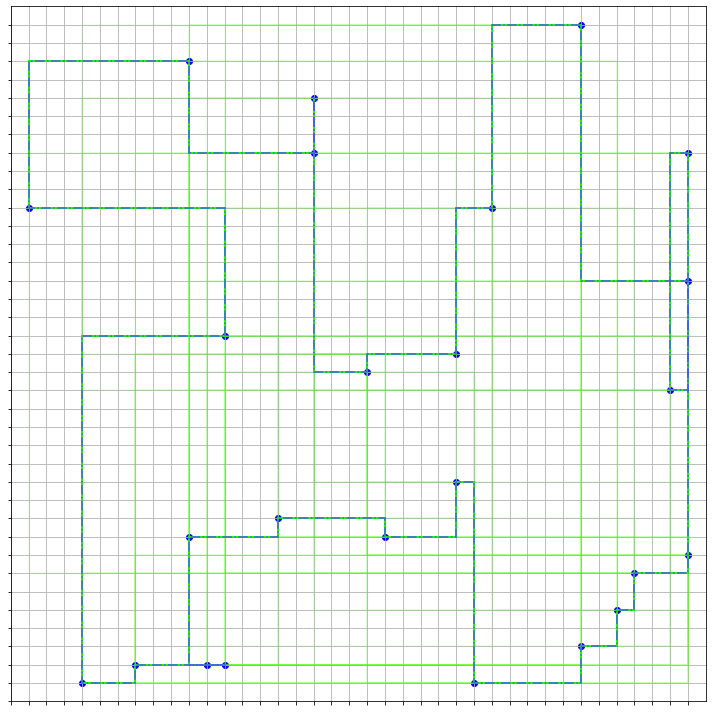

In [8]:
X = synthetic_points()
gen = Genetic(200, 100, 20, l1_distance)
HTML(visualize_genetic(X, gen).to_jshtml())